In [1]:
#!/usr/bin/env python
# coding: utf-8

# In[1]:


import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import scanpy.external as sce
# import scrublet as scr
import scirpy as ir
# import muon as mu
#from vpolo.alevin import parser # to parse alevin output
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm
import statsmodels.stats.multitest as multi

import re

seed = 0
np.random.seed(seed)

import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42


# In[2]:


sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis', transparent=False, frameon=False)  # low dpi (dots per inch) yields small inline figures

import matplotlib as mpl
# 2 lines below solved the facecolor problem.
# mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
sc.settings.autosave = True
sc.logging.print_header()

version = '241204_Myelo_crosstissue'

results_file = '../scanpy/{}/res.h5ad'.format(version)

import os
os.makedirs('../scanpy/{}'.format(version), exist_ok=True)

sc.settings.figdir = '../scanpy/{}/graph'.format(version)
sc.settings.cachedir = '../scanpy/{}/cache'.format(version)

2025-04-22 14:13:20.214558: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-22 14:13:21.451572: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-22 14:13:21.763251: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-22 14:13:21.888818: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-22 14:13:22.748311: I tensorflow/core/platform/cpu_feature_guar

scanpy==1.10.2 anndata==0.10.9 umap==0.5.6 numpy==1.26.4 scipy==1.15.2 pandas==2.2.3 scikit-learn==1.5.1 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13


In [2]:
adata = sc.read(results_file)

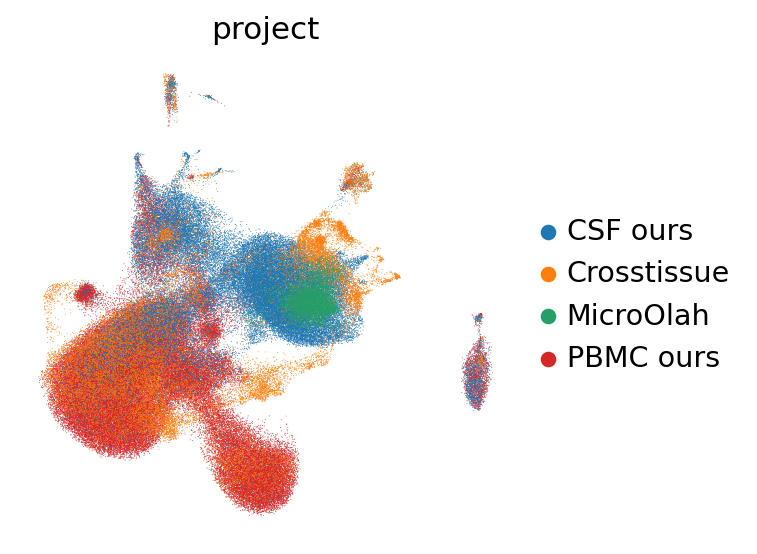

In [3]:
sc.pl.umap(adata, color=['project'], save='project')

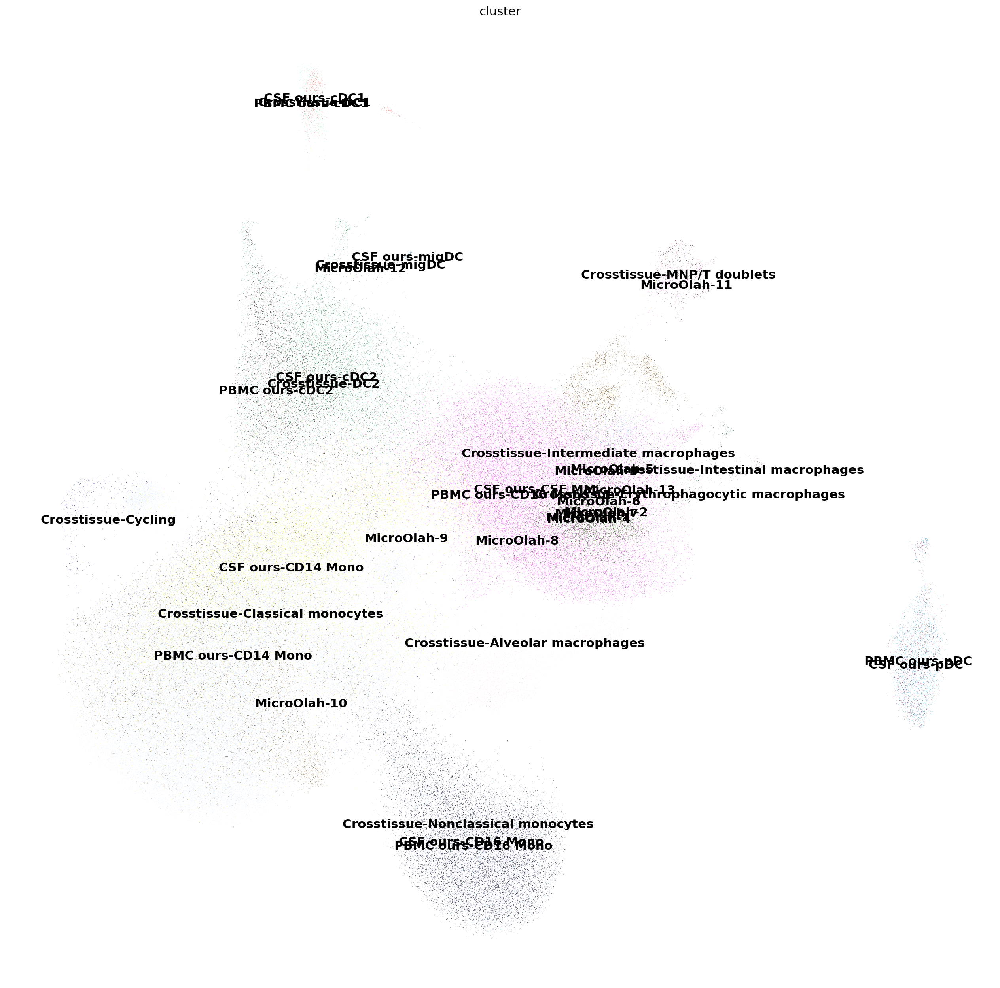

In [5]:
with plt.rc_context({"figure.figsize": (20, 20)}):
    sc.pl.umap(adata, color=['cluster'], legend_loc='on data', save='cluster')

In [13]:
mpl.rcParams.update({"axes.grid" : False})

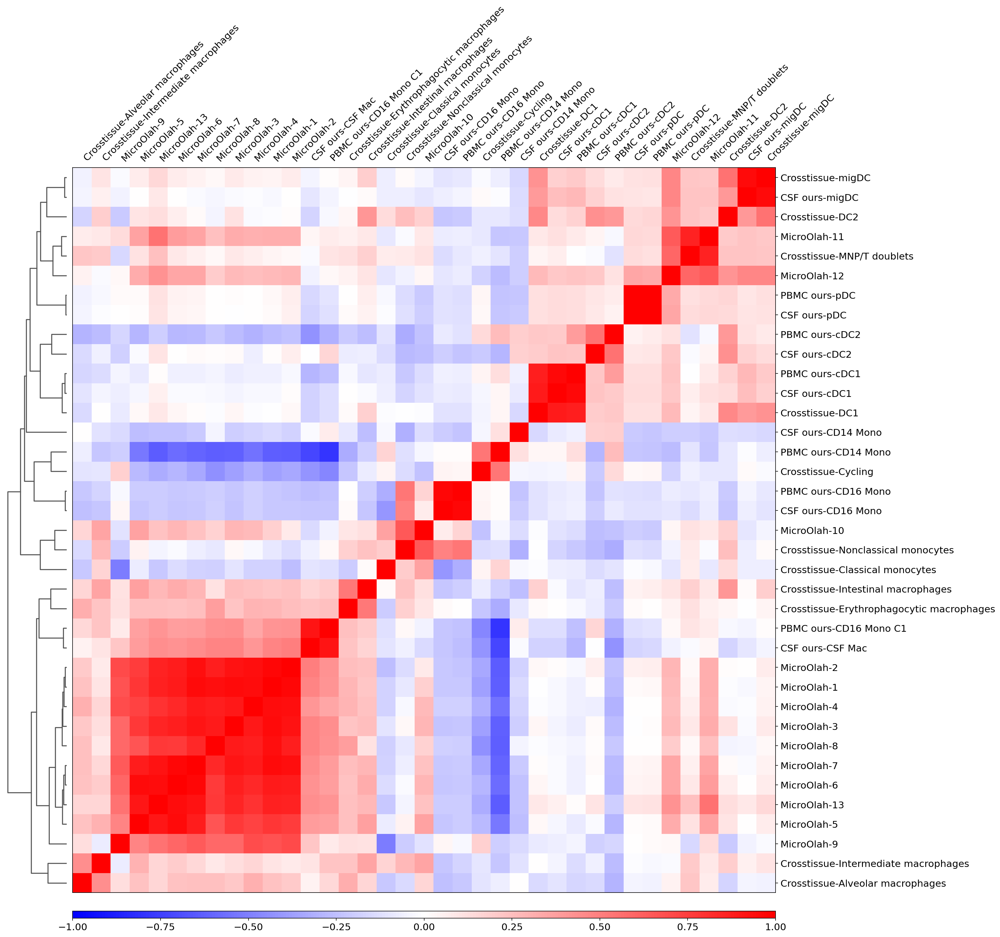

In [14]:
ax = sc.pl.correlation_matrix(adata, "cluster", figsize=(20, 20))

In [7]:
adata.obs.project.unique()

['PBMC ours', 'CSF ours', 'Crosstissue', 'MicroOlah']
Categories (4, object): ['CSF ours', 'Crosstissue', 'MicroOlah', 'PBMC ours']

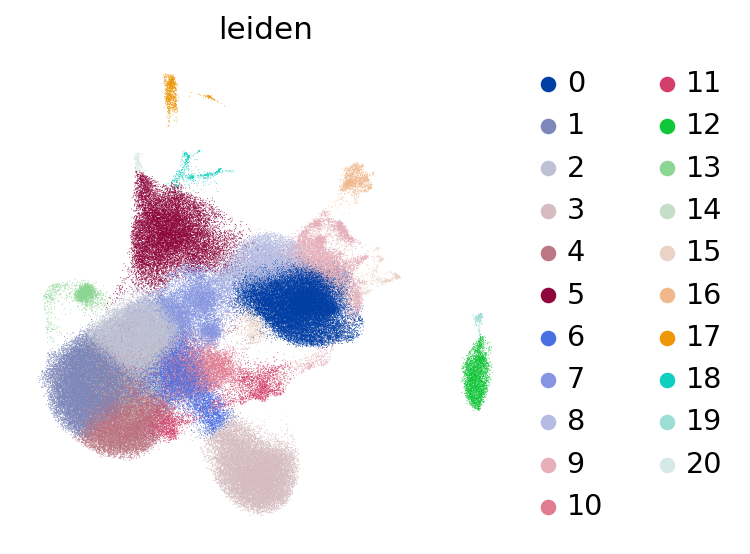

In [49]:
sc.pl.umap(adata, color=['leiden'])

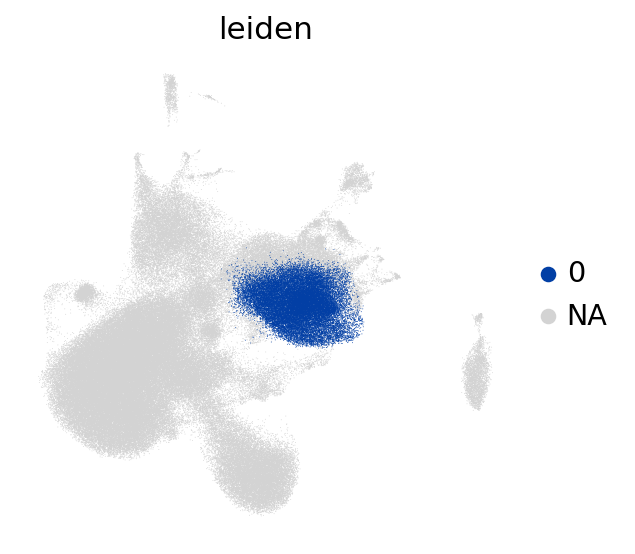

In [57]:
sc.pl.umap(adata, color=['leiden'], groups=['0'], save='leiden0')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:39)


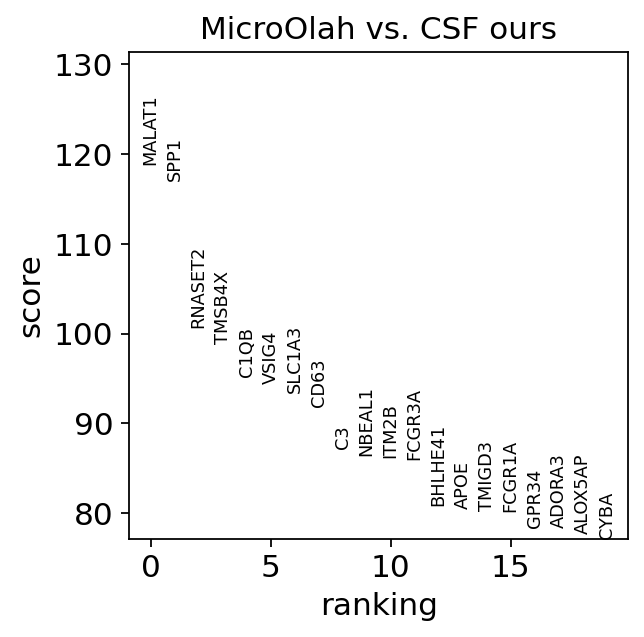

In [50]:
a = adata[adata.obs['leiden']=='0'].copy()
sc.tl.rank_genes_groups(a, "project", groups=["MicroOlah"], reference="CSF ours", method="wilcoxon")
sc.pl.rank_genes_groups(a, groups=["MicroOlah"], n_genes=20)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:38)


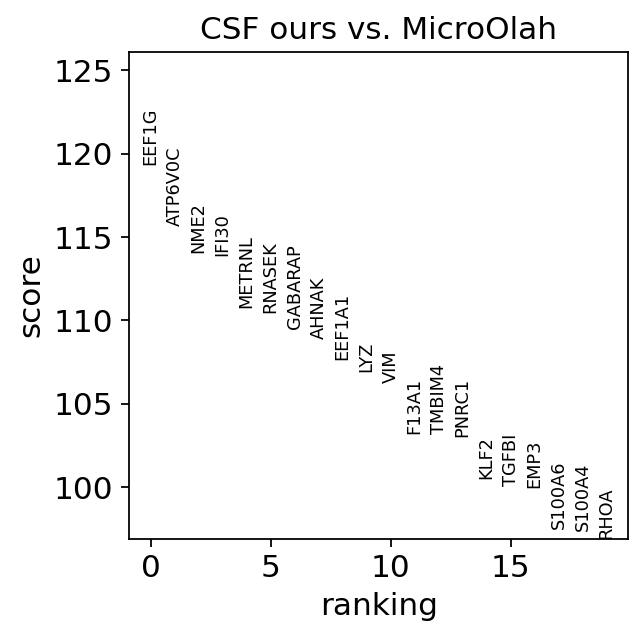

In [51]:
sc.tl.rank_genes_groups(a, "project", groups=["CSF ours"], reference="MicroOlah", method="wilcoxon")
sc.pl.rank_genes_groups(a, groups=["CSF ours"], n_genes=20)

In [52]:
sc.get.rank_genes_groups_df(a, group="CSF ours").head(5)

,names,scores,logfoldchanges,pvals,pvals_adj
0,EEF1G,119.347755,5.645822,0.0,0.0
1,ATP6V0C,115.638649,7.958299,0.0,0.0
2,NME2,114.041061,4.537497,0.0,0.0
3,IFI30,113.849823,5.203560,0.0,0.0
4,METRNL,110.772339,8.233957,0.0,0.0


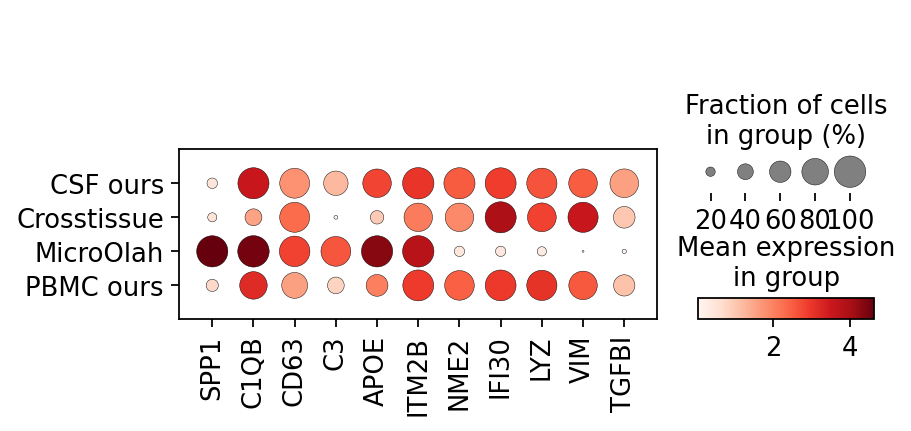

In [58]:
sc.pl.dotplot(a, groupby='project', 
var_names=['SPP1', 'C1QB', 'CD63', 'C3', 'APOE', 'ITM2B', 'NME2', 'IFI30', 'LYZ', 'VIM', 'TGFBI'],
save='leiden0degs')

In [44]:
list_plot_genes = ['FCN1', 'CD14', 'FCGR3A', 'LYN', 'C1QC', 'TREM2', 'XCR1', 'CLEC10A', 'FCER1A',
    'CCR7', 'LAMP3', 'IRF8', 'IL3RA']
vmaxs = list(adata.raw[:,list_plot_genes].X.toarray().max(axis=0))

In [32]:
adata[:,list_plot_genes].raw.X.max(axis=1)

<183280x1 sparse matrix of type '<class 'numpy.float64'>'
	with 183280 stored elements in COOrdinate format>

In [43]:
# to dense
list(adata.raw[:,list_plot_genes].X.toarray().max(axis=0))

[5.032924711607776,
 5.744582127358673,
 5.097845315693188,
 4.6782363075143785,
 6.017570811100333,
 4.50445196643967,
 3.430606212083607,
 4.103937873399087,
 4.535349262986781,
 4.7040126960441535,
 4.318885970383778,
 4.949070222901955,
 4.340077099748884]

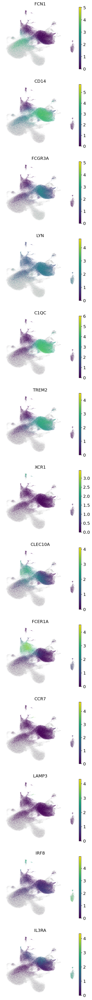

In [45]:
sc.pl.umap(adata, 
    color=list_plot_genes, 
    vmax=vmaxs, 
    mask_obs=(adata.obs.project == "CSF ours"), 
    save='CSFours_genes', 
    ncols=1)

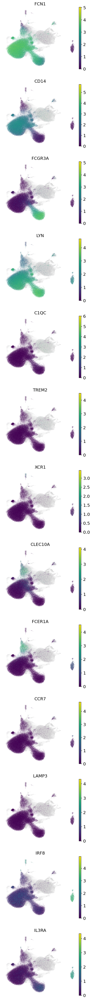

In [46]:
sc.pl.umap(adata, 
    color=list_plot_genes, 
    vmax=vmaxs, 
    mask_obs=(adata.obs.project == "PBMC ours"), 
    save='PBMCours_genes', 
    ncols=1)

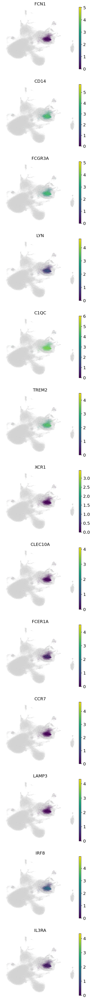

In [47]:
sc.pl.umap(adata, 
    color=list_plot_genes, 
    vmax=vmaxs, 
    mask_obs=(adata.obs.project == "MicroOlah"), 
    save='MicroOlah_genes', 
    ncols=1)

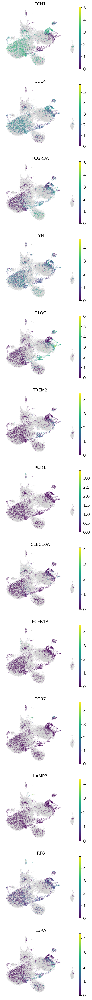

In [48]:
sc.pl.umap(adata, 
    color=list_plot_genes, 
    vmax=vmaxs, 
    mask_obs=(adata.obs.project == "Crosstissue"), 
    save='Crosstissue_genes', 
    ncols=1)

In [16]:
sc.tl.embedding_density(adata, basis='umap', groupby='project')
# sc.pl.embedding_density(
#     adata, basis='umap', key='umap_density_project',
# )

computing density on 'umap'
--> added
    'umap_density_project', densities (adata.obs)
    'umap_density_project_params', parameter (adata.uns)


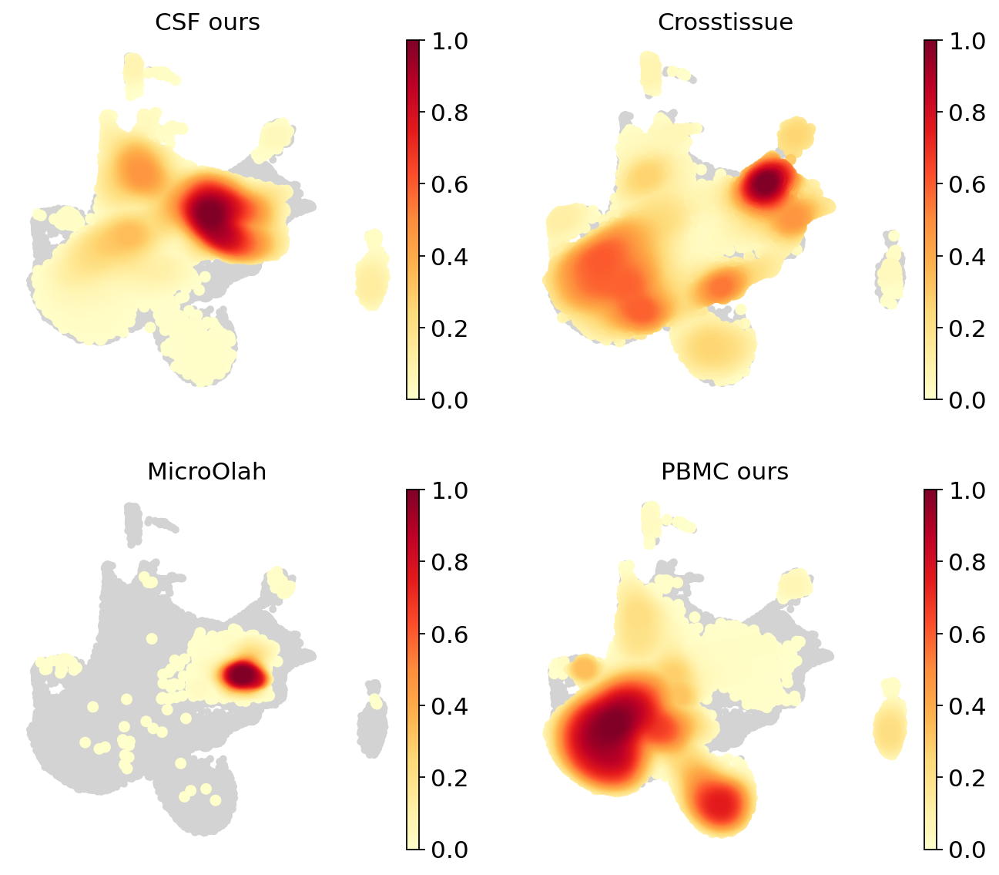

In [17]:
sc.pl.embedding_density(
    adata, basis='umap', key='umap_density_project', ncols=2
)

In [3]:
adata

AnnData object with n_obs × n_vars = 183280 × 15447
    obs: 'cluster', 'sample', 'organ', 'project', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'S_score', 'G2M_score', 'phase', 'leiden'
    var: 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

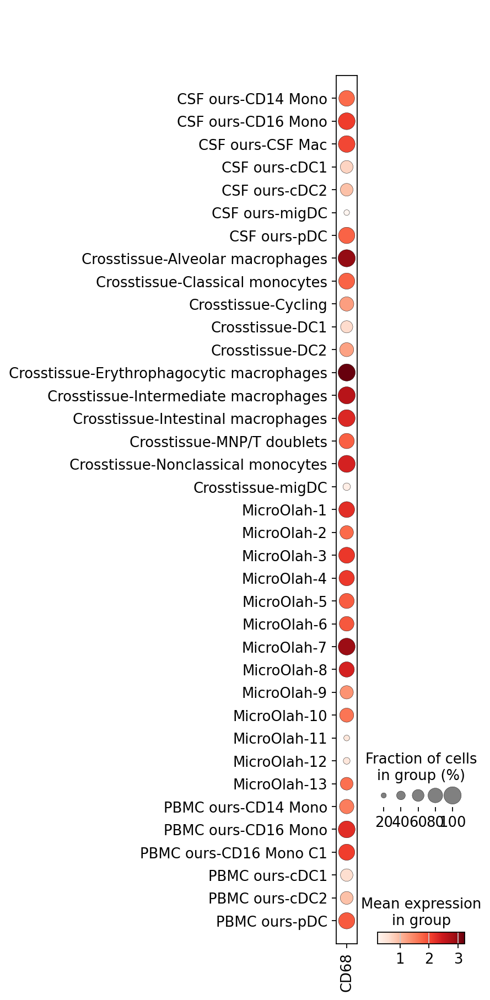

In [4]:
sc.pl.dotplot(adata, var_names=['CD68'], groupby='cluster')

In [5]:
list(adata.obs['cluster'].unique())

['PBMC ours-CD14 Mono',
 'PBMC ours-CD16 Mono',
 'PBMC ours-cDC2',
 'PBMC ours-pDC',
 'PBMC ours-cDC1',
 'PBMC ours-CD16 Mono C1',
 'CSF ours-CSF Mac',
 'CSF ours-cDC2',
 'CSF ours-CD14 Mono',
 'CSF ours-pDC',
 'CSF ours-migDC',
 'CSF ours-cDC1',
 'CSF ours-CD16 Mono',
 'Crosstissue-Erythrophagocytic macrophages',
 'Crosstissue-DC2',
 'Crosstissue-DC1',
 'Crosstissue-Intermediate macrophages',
 'Crosstissue-Alveolar macrophages',
 'Crosstissue-Classical monocytes',
 'Crosstissue-migDC',
 'Crosstissue-MNP/T doublets',
 'Crosstissue-Nonclassical monocytes',
 'Crosstissue-Cycling',
 'Crosstissue-Intestinal macrophages',
 'MicroOlah-2',
 'MicroOlah-4',
 'MicroOlah-1',
 'MicroOlah-9',
 'MicroOlah-5',
 'MicroOlah-6',
 'MicroOlah-7',
 'MicroOlah-8',
 'MicroOlah-3',
 'MicroOlah-11',
 'MicroOlah-12',
 'MicroOlah-13',
 'MicroOlah-10']

In [ ]:
dict_cat = {'PBMC ours-CD14 Mono' : 'Monocyte',
 'PBMC ours-CD16 Mono' : 'Monocyte',
 'PBMC ours-cDC2' : 'DC',
 'PBMC ours-pDC' : 'DC',
 'PBMC ours-cDC1' : 'DC',
 'PBMC ours-CD16 Mono C1'  : 'Monocyte',
 'CSF ours-CSF Mac'  : 'CSF Mac',
 'CSF ours-cDC2' : 'DC',
 'CSF ours-CD14 Mono' : 'Monocyte',
 'CSF ours-pDC' : 'DC',
 'CSF ours-migDC' : 'DC',
 'CSF ours-cDC1' : 'DC',
 'CSF ours-CD16 Mono' : 'Monocyte',
 'Crosstissue-Erythrophagocytic macrophages' : 'Macrophage',
 'Crosstissue-DC2' : 'DC',
 'Crosstissue-DC1' : 'DC',
 'Crosstissue-Intermediate macrophages' : 'Macrophage',
 'Crosstissue-Alveolar macrophages' : 'Macrophage',
 'Crosstissue-Classical monocytes' : 'Monocyte',
 'Crosstissue-migDC' : 'DC',
 'Crosstissue-MNP/T doublets' : 'Others',
 'Crosstissue-Nonclassical monocytes' : 'Monocyte',
 'Crosstissue-Cycling' : 'Others',
 'Crosstissue-Intestinal macrophages' : 'Macrophage',
 'MicroOlah-2': 'Microglia',
 'MicroOlah-4': 'Microglia',
 'MicroOlah-1': 'Microglia',
 'MicroOlah-9': 'Microglia',
 'MicroOlah-5': 'Microglia',
 'MicroOlah-6': 'Microglia',
 'MicroOlah-7': 'Microglia',
 'MicroOlah-8': 'Microglia',
 'MicroOlah-3': 'Microglia',
 'MicroOlah-11': 'Microglia',
 'MicroOlah-12': 'Microglia',
 'MicroOlah-13': 'Microglia',
 'MicroOlah-10': 'Microglia'}

In [7]:
adata.obs['cat'] = [dict_cat[x] for x in adata.obs['cluster']]

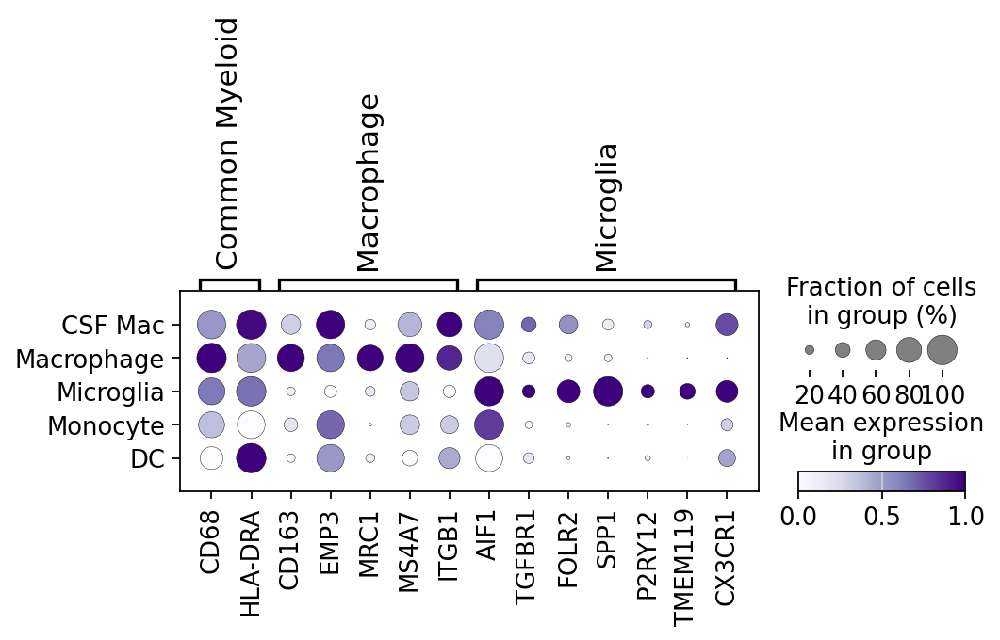

In [42]:
# markers = {'CD68': 'Common Myeloid', 'MRC1': 'Macrophage', 'EMP3': 'Macrophage', 'CD163': 'Macrophage', 'MS4A7': 'Macrophage', 
# 'LYVE1': 'Microglia', 'FOLR2': 'Microglia', 'SPP1': 'Microglia', 'ITGB1': 'Microglia'}
markers = {
    'Common Myeloid': ['CD68', 'HLA-DRA'],
    'Macrophage': ['CD163', 'EMP3', 'MRC1', 'MS4A7', 'ITGB1'],
    'Microglia': ['AIF1', 'TGFBR1', 'FOLR2', 'SPP1', 'P2RY12', 'TMEM119', 'CX3CR1'],
}
sc.pl.dotplot(adata[adata.obs['cat'].isin(['CSF Mac', 'Macrophage', 'Microglia','Monocyte', 'DC',])],
var_names=markers, 
standard_scale="var",
groupby='cat', categories_order=['CSF Mac', 'Macrophage', 'Microglia','Monocyte', 'DC', ],
cmap='Purples', 
save='comp_mac_micro.pdf')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cat']`


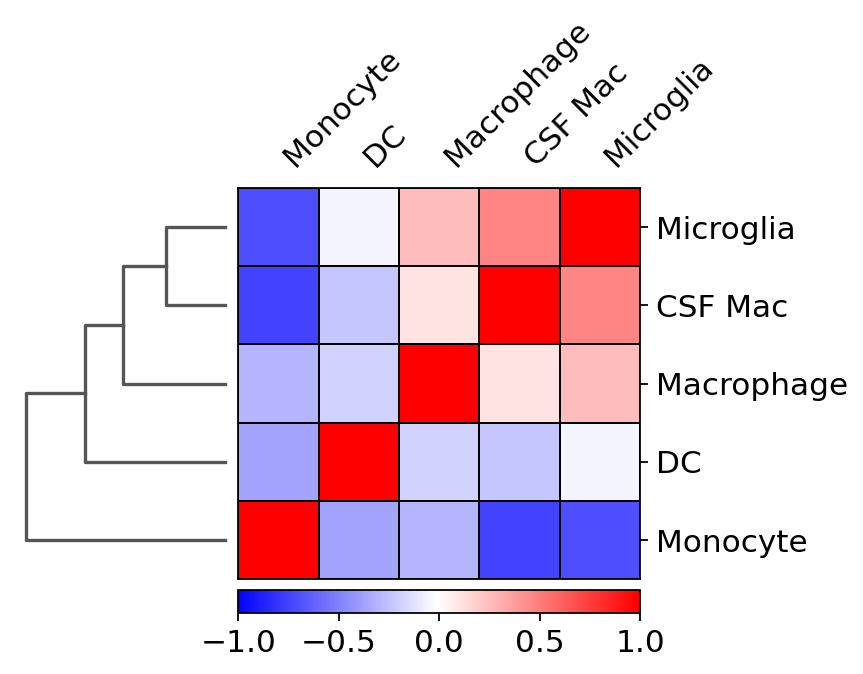

In [56]:
mpl.rcParams.update({"axes.grid" : False})
a = adata[adata.obs['cat']!='Others'].copy()
sc.tl.dendrogram(a, groupby='cat')
ax = sc.pl.correlation_matrix(a, "cat", figsize=(5, 3.5), save='cat_corrplot')

In [53]:
dict_cat = {'PBMC ours-CD14 Mono' : 'Monocyte',
 'PBMC ours-CD16 Mono' : 'Monocyte',
 'PBMC ours-cDC2' : 'DC',
 'PBMC ours-pDC' : 'DC',
 'PBMC ours-cDC1' : 'DC',
 'PBMC ours-CD16 Mono C1'  : 'Monocyte',
 'CSF ours-CSF Mac'  : 'CSF Mac',
 'CSF ours-cDC2' : 'DC',
 'CSF ours-CD14 Mono' : 'Monocyte',
 'CSF ours-pDC' : 'DC',
 'CSF ours-migDC' : 'DC',
 'CSF ours-cDC1' : 'DC',
 'CSF ours-CD16 Mono' : 'Monocyte',
 'Crosstissue-Erythrophagocytic macrophages' : 'Macrophage',
 'Crosstissue-DC2' : 'DC',
 'Crosstissue-DC1' : 'DC',
 'Crosstissue-Intermediate macrophages' : 'Other Macrophage',
 'Crosstissue-Alveolar macrophages' : 'Other Macrophage',
 'Crosstissue-Classical monocytes' : 'Monocyte',
 'Crosstissue-migDC' : 'DC',
 'Crosstissue-MNP/T doublets' : 'Others',
 'Crosstissue-Nonclassical monocytes' : 'Monocyte',
 'Crosstissue-Cycling' : 'Others',
 'Crosstissue-Intestinal macrophages' : 'Macrophage',
 'MicroOlah-2': 'Microglia',
 'MicroOlah-4': 'Microglia',
 'MicroOlah-1': 'Microglia',
 'MicroOlah-9': 'Microglia',
 'MicroOlah-5': 'Microglia',
 'MicroOlah-6': 'Microglia',
 'MicroOlah-7': 'Microglia',
 'MicroOlah-8': 'Microglia',
 'MicroOlah-3': 'Microglia',
 'MicroOlah-11': 'Microglia',
 'MicroOlah-12': 'Microglia',
 'MicroOlah-13': 'Microglia',
 'MicroOlah-10': 'Microglia'}

adata.obs['cat2'] = [dict_cat[x] for x in adata.obs['cluster']]
adata.obs['cat2'] = adata.obs['cat2'].astype('category')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cat2']`


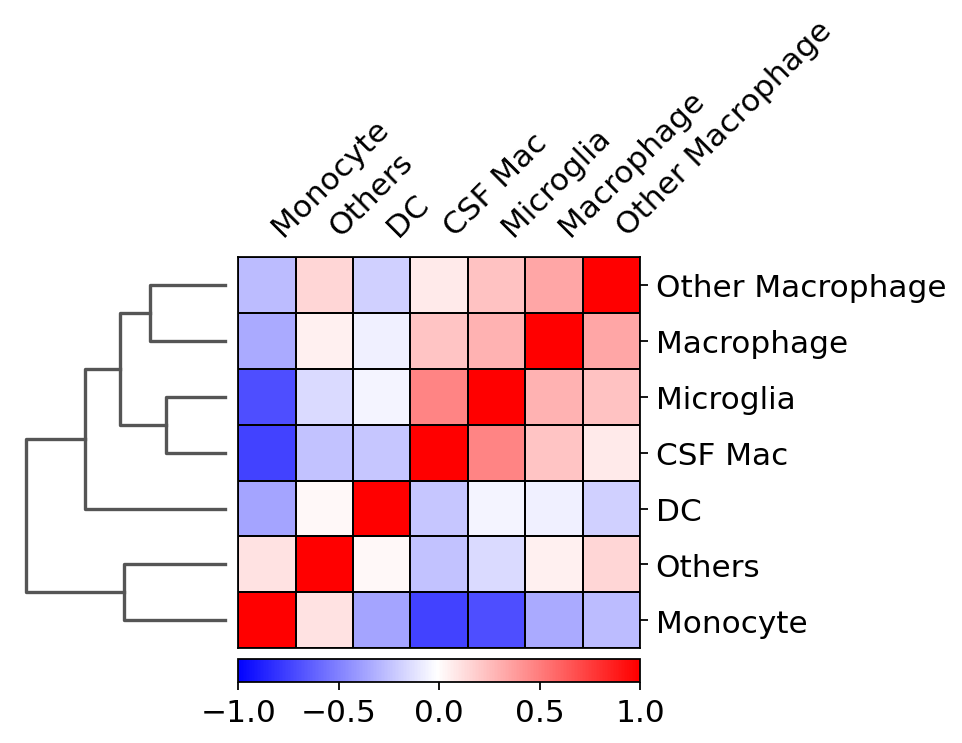

In [54]:
mpl.rcParams.update({"axes.grid" : False})
sc.tl.dendrogram(adata, groupby='cat2')
ax = sc.pl.correlation_matrix(adata, "cat2", figsize=(5, 3.5))